# Import Required Libraries
This cell imports all the Python packages and libraries needed for the analysis below.

In [1]:
import osmnx as ox, networkx as nx, matplotlib.cm as cm, pandas as pd, numpy as np
import geopandas as gpd
from shapely.geometry import Point, mapping
%matplotlib inline

import warnings
warnings.simplefilter(action="ignore")
pd.options.display.float_format = '{:20.2f}'.format
pd.options.mode.chained_assignment = None

import cityImage as ci

import seaborn as sns

import dill

from scipy.stats import boxcox
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.cluster import KMeans

# Set up file paths and parameters
This cell defines file paths, city names, and other parameters used throughout the analysis.

In [2]:
city_name = 'Leeds'
epsg = 25832
crs = 'EPSG:'+str(epsg)
place = 'Leeds'
download_method = 'OSMplace'
distance = None

# Load and prepare network data
This cell loads the network data and prepares it for further analysis, such as cleaning or extracting features.

In [ ]:
# Download and clean the OSM network for Leeds
nodes_graph, edges_graph = ci.get_network_fromOSM(place, download_method, 'walk', epsg, distance=distance)
nodes_graph, edges_graph = ci.clean_network(
    nodes_graph,
    edges_graph,
    dead_ends=False,
    remove_islands=True,
    self_loops=True,
    same_vertexes_edges=True
)

In [ ]:
edges_graph.head(2)

### Create the dual_graph

In [ ]:
# Creating and saving the dual geodataframes
nodesDual_graph, edgesDual_graph = ci.dual_gdf(nodes_graph, edges_graph, epsg)

In [ ]:
# creating the dual_graph
dual_graph = ci.dual_graph_fromGDF(nodesDual_graph, edgesDual_graph)

In [ ]:
import matplotlib.pyplot as plt

plt.figure(dpi=300, figsize=(10,10))
fig = ci.plot_gdf(
    edges_graph,
    title = city_name + ': Street Network - drive',
    black_background = False,
    geometry_size = 0.1
)


---

### Degree and Average node_degree for each edge

In [ ]:
# Calculate node degree using the networkx graph from cityImage
# If you used ci.get_network_fromOSM, you likely have a NetworkX graph as nodes_graph.graph or similar
if hasattr(nodes_graph, 'graph') and isinstance(nodes_graph.graph, nx.Graph):
    G = nodes_graph.graph
else:
    # If not, try to reconstruct from edges_graph
    G = nx.from_pandas_edgelist(edges_graph, 'u', 'v')

# Map node degrees to nodes_graph index
nodes_graph['degree'] = nodes_graph.index.map(dict(G.degree()))
nodes_graph.head(1)

# 1 second

#### Node degree

In [ ]:
# Ensure nodes_graph has a 'degree' column (already calculated previously)
# nodes_graph['degree'] = nodes_graph.index.map(dict(graph.degree()))

# Map node degrees to edges
def get_edge_node_degrees(row, nodes_graph):
    u, v = row['u'], row['v']  # edge endpoints
    deg_u = nodes_graph.loc[u, 'degree']
    deg_v = nodes_graph.loc[v, 'degree']
    return (deg_u + deg_v) / 2  # mean degree

# If 'u' and 'v' columns exist in edges_graph:
edges_graph['mean_node_degree'] = edges_graph.apply(
    lambda row: get_edge_node_degrees(row, nodes_graph), axis=1
)

# # Save the updated GeoDataFrame using dill
# with open('C:/Users/gy21jw/Documents/Coding/CDAS_Dissertation/python_files/edges_graph.dill', 'wb') as file:
#     dill.dump(edges_graph, file)

edges_graph.head(1)
# 2.2seconds

### Dead-end Density

In [ ]:
buffer_distance = 900  # meters

# 1. Identify dead-end nodes (degree == 1)
dead_end_nodes = nodes_graph[nodes_graph['degree'] == 1].copy()

# 2. Create buffers for all edges
edges_graph['buffer'] = edges_graph.geometry.buffer(buffer_distance)

# 3. Prepare a GeoDataFrame of buffers
buffers_gdf = edges_graph[['buffer']].copy()
buffers_gdf = buffers_gdf.set_geometry('buffer')
buffers_gdf['buffer_id'] = buffers_gdf.index

# 4. Spatial join: which dead ends fall in which buffer
joined = gpd.sjoin(
    dead_end_nodes[['geometry']],  # dead-end points
    buffers_gdf,                   # buffers
    how='left',
    predicate='within'
)

# 5. Count dead ends for each buffer (group by buffer index)
dead_end_counts = joined.groupby('buffer_id').size()

# 6. Calculate buffer areas
buffer_areas = buffers_gdf['buffer'].area

# 7. Assign dead ends density (per km²)
edges_graph['dead_end_density'] = (dead_end_counts / buffer_areas) * 1e6
edges_graph['dead_end_density'] = edges_graph['dead_end_density'].fillna(0)

# 8. Clean up
edges_graph.drop(columns=['buffer'], inplace=True)
del buffers_gdf, joined, dead_end_counts, buffer_areas, dead_end_nodes

# # Save the updated GeoDataFrame using dill
# with open('C:/Users/gy21jw/Documents/Coding/CDAS_Dissertation/python_files/edges_graph.dill', 'wb') as file:
#     dill.dump(edges_graph, file)

edges_graph.head(2)
# 33 seconds

#### Intersection density

In [ ]:
# Create a NetworkX graph from the edges_graph DataFrame
import networkx as nx
graph = nx.from_pandas_edgelist(edges_graph, 'u', 'v')

In [ ]:
# Calculate node degrees from the NetworkX graph
degree_dict = dict(graph.degree())

# Add the degree as a new column in nodes_graph
nodes_graph['degree'] = nodes_graph.index.map(degree_dict)

# # Save the updated GeoDataFrame using dill
# with open('C:/Users/gy21jw/Documents/Coding/CDAS_Dissertation/python_files/nodes_graph.dill', 'wb') as file:
#     dill.dump(nodes_graph, file)

nodes_graph.head(2)
# 1 second

In [ ]:
buffer_distance = 900  # meters

# 1. Identify intersection nodes (degree >= 3)
nodes_graph['degree'] = nodes_graph['degree'] if 'degree' in nodes_graph else nodes_graph.degree
intersection_nodes = nodes_graph[nodes_graph['degree'] >= 3].copy()

# 2. Create buffers for all edges
edges_graph['buffer'] = edges_graph.geometry.buffer(buffer_distance)

# 3. Prepare a GeoDataFrame of buffers
buffers_gdf = edges_graph[['buffer']].copy()
buffers_gdf = buffers_gdf.set_geometry('buffer')
buffers_gdf['buffer_id'] = buffers_gdf.index

# 4. Spatial join: which intersections fall in which buffer
joined = gpd.sjoin(
    intersection_nodes[['geometry']],  # intersection points
    buffers_gdf,                       # buffers
    how='left',
    predicate='within'
)

# 5. Count intersections for each buffer (group by buffer index)
intersection_counts = joined.groupby('buffer_id').size()

# 6. Calculate buffer areas
buffer_areas = buffers_gdf.to_crs(epsg=3857)['buffer'].area

# 7. Assign intersection density (per km²)
edges_graph['intersection_density'] = (intersection_counts / buffer_areas) * 1e6
edges_graph['intersection_density'] = edges_graph['intersection_density'].fillna(0)

# 8. Clean up
edges_graph.drop(columns=['buffer'], inplace=True)

# # Save the updated GeoDataFrame using dill
# with open('C:/Users/gy21jw/Documents/Coding/CDAS_Dissertation/python_files/edges_graph.dill', 'wb') as file:
#     dill.dump(edges_graph, file)

# del buffers_gdf, joined, intersection_counts, buffer_areas

# districts = districts.merge(
#     edges_graph[['edge_ID', 'intersection_density']],
#     how='left',
#     on='edge_ID'  # Adjust this column name based on your dataset
# )
edges_graph.head(2)
# 2.5 minutes

### Edge endpoint degree variance

In [ ]:
def edge_degree_variance(row, nodes_graph):
    u, v = row['u'], row['v']
    deg_u = nodes_graph.loc[u, 'degree']
    deg_v = nodes_graph.loc[v, 'degree']
    return np.var([deg_u, deg_v])

edges_graph['edge_degree_variance'] = edges_graph.apply(
    lambda row: edge_degree_variance(row, nodes_graph), axis=1
)

# # Save the updated GeoDataFrame using dill
# with open('C:/Users/gy21jw/Documents/Coding/CDAS_Dissertation/python_files/edges_graph.dill', 'wb') as file:
#     dill.dump(edges_graph, file)
edges_graph.head(2)
# 4 seconds

#### 6. Circuity

In [ ]:
def calculate_circuity(row, nodes_graph):
    u, v = row['u'], row['v']
    # Get endpoint coordinates
    point_u = nodes_graph.loc[u, 'geometry']
    point_v = nodes_graph.loc[v, 'geometry']
    # Euclidean distance
    euclidean_dist = point_u.distance(point_v)
    # Actual edge length
    actual_length = row['length']
    # Avoid division by sero
    if euclidean_dist == 0:
        return 1  # or np.nan
    return actual_length / euclidean_dist

edges_graph['circuity'] = edges_graph.apply(
    lambda row: calculate_circuity(row, nodes_graph), axis=1
)

# # Save the updated GeoDataFrame using dill
# with open('C:/Users/gy21jw/Documents/Coding/CDAS_Dissertation/python_files/edges_graph.dill', 'wb') as file:
#     dill.dump(edges_graph, file)
edges_graph.head(2)
# 3 seconds

#### 7. Orientation and orientation entropy

In [ ]:
# Calculate the abgles for all the edges
from scipy.stats import entropy
def edge_orientation(line):
    x0, y0, x1, y1 = *line.coords[0], *line.coords[-1]
    angle = np.degrees(np.arctan2(y1 - y0, x1 - x0)) % 180
    return angle

edges_graph['orientation'] = edges_graph.geometry.apply(edge_orientation)

# Calculate the angle entropy

def orientation_entropy_for_edge(row, edges_graph, buffer_distance=900, bins=18):
    buffer = row.geometry.buffer(buffer_distance)
    intersecting = edges_graph[edges_graph.geometry.intersects(buffer)]
    angles = intersecting['orientation']  # Use precomputed angles
    hist, _ = np.histogram(angles, bins=bins, range=(0, 180), density=True)
    hist += 1e-12
    return entropy(hist)

edges_graph['orientation_entropy'] = edges_graph.apply(
    lambda row: orientation_entropy_for_edge(row, edges_graph), axis=1
)

# # Save the updated GeoDataFrame using dill
# with open('C:/Users/gy21jw/Documents/Coding/CDAS_Dissertation/python_files/edges_graph.dill', 'wb') as file:
#     dill.dump(edges_graph, file)
edges_graph.head(2)

# 41 minutes

#### Node constraint

In [ ]:
# 1. Calculate node constraint for all nodes
constraint_dict = nx.constraint(graph)

# 2. Add constraint as a column to nodes_graph
nodes_graph['constraint'] = nodes_graph.index.map(constraint_dict)

# 3. Assign mean constraint of endpoints to each edge
def get_edge_node_constraint(row, nodes_graph):
    u, v = row['u'], row['v']
    c_u = nodes_graph.loc[u, 'constraint']
    c_v = nodes_graph.loc[v, 'constraint']
    return (c_u + c_v) / 2

edges_graph['mean_node_constraint'] = edges_graph.apply(
    lambda row: get_edge_node_constraint(row, nodes_graph), axis=1
)

# # Save the updated GeoDataFrames using dill
# with open('C:/Users/gy21jw/Documents/Coding/CDAS_Dissertation/python_files/nodes_graph.dill', 'wb') as file:
#     dill.dump(nodes_graph, file)
# with open('C:/Users/gy21jw/Documents/Coding/CDAS_Dissertation/python_files/edges_graph.dill', 'wb') as file:
#     dill.dump(edges_graph, file)
edges_graph.head(2)

# 15 seconds

### Edge Density

In [ ]:
# Calculate edge density for each edge's buffer area (per km²)
buffer_distance = 900  # meters (same as other density measures)

# 1. Create buffers for all edges
edges_graph['buffer'] = edges_graph.geometry.buffer(buffer_distance)

# 2. Calculate buffer areas in projected CRS (meters)
buffers_gdf = edges_graph[['buffer']].copy()
buffers_gdf = buffers_gdf.set_geometry('buffer')
buffers_gdf['buffer_id'] = buffers_gdf.index
buffers_gdf = buffers_gdf.to_crs(epsg=3857)  # Project to meters for area calculation
buffer_areas = buffers_gdf['buffer'].area

# 3. Count number of edges intersecting each buffer
# (self-intersection included, so density is at least 1)
def count_edges_in_buffer(row, edges_gdf):
    buffer_geom = row['buffer']
    return edges_gdf.geometry.intersects(buffer_geom).sum()

edges_graph['edge_count_in_buffer'] = edges_graph.apply(lambda row: count_edges_in_buffer(row, edges_graph), axis=1)

# 4. Calculate edge density (edges per km²)
edges_graph['edge_density'] = (edges_graph['edge_count_in_buffer'] / buffer_areas) * 1e6
edges_graph['edge_density'] = edges_graph['edge_density'].fillna(0)

# 5. Clean up temporary columns
edges_graph.drop(columns=['buffer', 'edge_count_in_buffer'], inplace=True)
del buffers_gdf, buffer_areas
edges_graph.head(2)

### sAVE THE GRAPHS DATA

In [ ]:
with open('C:/Users/gy21jw/Coding/transfer_resubmission/nodesDual_graph.dill', 'wb') as file:
    dill.dump(nodesDual_graph, file)
with open('C:/Users/gy21jw/Coding/transfer_resubmission/edgesDual_graph.dill', 'wb') as file:
    dill.dump(edgesDual_graph, file)
with open('C:/Users/gy21jw/Coding/transfer_resubmission/nodes_graph.dill', 'wb') as file:
    dill.dump(nodes_graph, file)
with open('C:/Users/gy21jw/Coding/transfer_resubmission/edges_graph.dill', 'wb') as file:
    dill.dump(edges_graph, file)
with open('C:/Users/gy21jw/Coding/transfer_resubmission/dual_graph.dill', 'wb') as file:
    dill.dump(dual_graph, file)

### Districts

Now that network measures have been calculated - use cityImage to identify districts (regions) in the network based on the 'rad' value

In [3]:
# load the edges_graph, nodes_graph and the nodesDual_graph and the edgesDual_graph
with open('C:/Users/gy21jw/Coding/transfer_resubmission/edges_graph.dill', 'rb') as file:
    edges_graph = dill.load(file)
with open('C:/Users/gy21jw/Coding/transfer_resubmission/nodes_graph.dill', 'rb') as file:
    nodes_graph = dill.load(file)
with open('C:/Users/gy21jw/Coding/transfer_resubmission/edgesDual_graph.dill', 'rb') as file:
    edgesDual_graph = dill.load(file)
with open('C:/Users/gy21jw/Coding/transfer_resubmission/nodesDual_graph.dill', 'rb') as file:
    nodesDual_graph = dill.load(file)
with open('C:/Users/gy21jw/Coding/transfer_resubmission/dual_graph.dill', 'rb') as file:
    dual_graph = dill.load(file)

In [4]:
# Uncomment the weights (or as many as required) - USE 'rad'
weights = [
    'rad'
    ]
districts = edges_graph.copy()
for weight in weights:
    districts = ci.identify_regions(
        dual_graph=dual_graph,
        edges_gdf=districts,
        weight = weight
        )
del weight
partition_counts = districts['p_rad'].value_counts().sort_values(ascending=False)
print(f"Found {len(partition_counts)} distinct regions")

Found 163 distinct regions


In [ ]:
# rename the last column in districts back to 'p_rad'
# districts.columns = [*districts.columns[:-1], 'p_rad']

# Check how many partitions were created
# partition_counts = districts['p_rad'].value_counts().sort_values(ascending=False)
# print(f"Found {len(partition_counts)} distinct regions")
# # Check sizes of partitions
# print(f"Largest region has {partition_counts.iloc[0]} edges ({partition_counts.iloc[0]/len(districts)*100:.1f}%)")
# print(f"Smallest region has {partition_counts.iloc[-1]} edges ({partition_counts.iloc[-1]/len(districts)*100:.1f}%)")
# print(f"Mean region size: {partition_counts.mean():.1f} edges")
# print(f"Median region size: {partition_counts.median():.1f} edges")

# # Distribution of top regions
# print("\nTop 10 regions by size:")
# for i, (region, count) in enumerate(partition_counts.head(10).items()):
#     print(f"  Region {region}: {count} edges ({count/len(districts)*100:.1f}%)")

<Figure size 1500x1200 with 0 Axes>

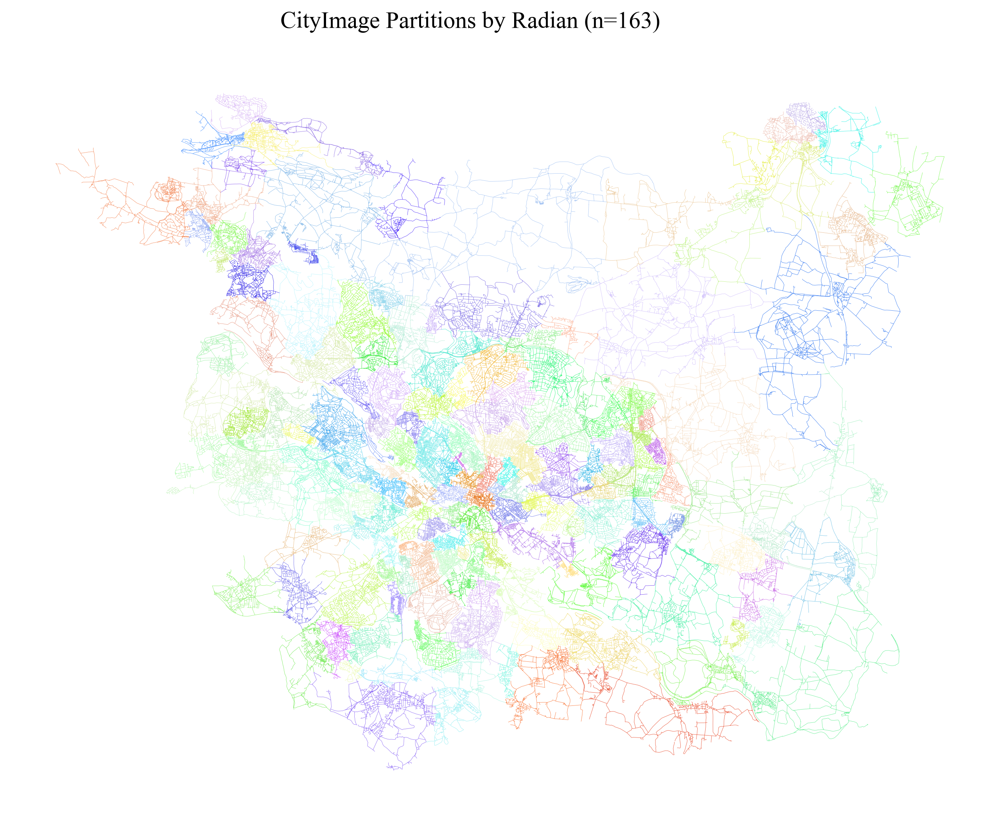

In [5]:
import matplotlib.pyplot as plt


columns = ['p_rad']
titles = [f'CityImage Partitions by Radian (n={len(partition_counts)})']

nlabels = max([len(districts[column].unique()) for column in columns])

cmap = ci.rand_cmap(nlabels = nlabels, type_color='bright')
plt.rcParams['figure.dpi'] = 300
fig = plt.figure(figsize=(10, 8), dpi=150)
fig = ci.plot_gdf(
    districts,
    column = columns[0],
    title = titles[0],
    geometry_size = 0.2,
    cmap = cmap,
    black_background = False,
    legend = False,
    figsize = (10, 8)
    )


### Cluster the Partitions

In [7]:
districts.columns

Index(['edgeID', 'u', 'v', 'key', 'geometry', 'length', 'name', 'highway',
       'oneway', 'lanes', 'bridge', 'tunnel', 'mean_node_degree',
       'dead_end_density', 'intersection_density', 'edge_degree_variance',
       'circuity', 'orientation', 'orientation_entropy',
       'mean_node_constraint', 'edge_density', 'p_rad'],
      dtype='object')

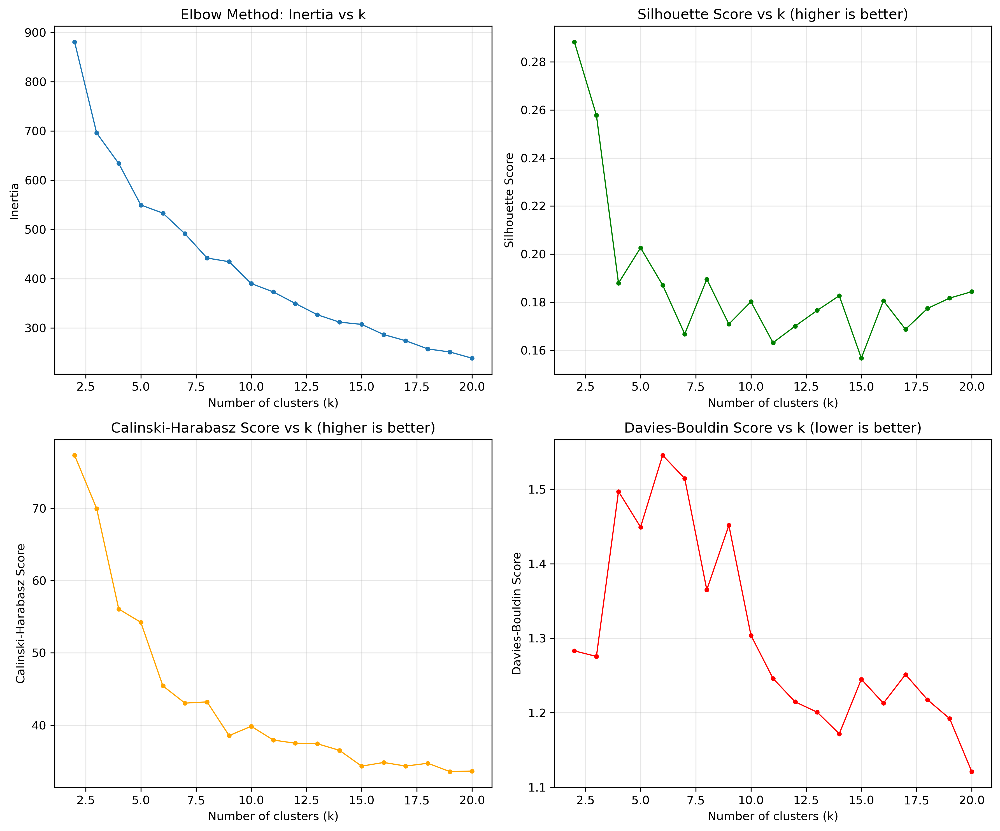

,inertia,silhouette,calinski_harabasz,davies_bouldin
2,880.82,0.29,77.35,1.28
3,695.61,0.26,69.97,1.28
4,633.66,0.19,56.07,1.50
5,549.52,0.20,54.23,1.45
6,532.93,0.19,45.43,1.55
7,491.03,0.17,43.05,1.51
8,441.77,0.19,43.22,1.36
9,434.25,0.17,38.56,1.45
10,389.99,0.18,39.84,1.30
11,373.00,0.16,37.94,1.25


In [8]:
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import matplotlib.pyplot as plt
import numpy as np

metrics = [
'mean_node_degree',
'dead_end_density',
'intersection_density',
'edge_degree_variance',
'circuity',
'orientation_entropy',
'mean_node_constraint',
'edge_density'
]

# Aggregate metrics by partition
partition_metrics = districts.groupby('p_rad')[metrics].mean()

scaler = StandardScaler()
X = scaler.fit_transform(partition_metrics.values)

scores = {
    'inertia': [],
    'silhouette': [],
    'calinski_harabasz': [],
    'davies_bouldin': []
}
k_range = range(2, 21)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=1977)
    labels = kmeans.fit_predict(X)
    scores['inertia'].append(kmeans.inertia_)
    scores['silhouette'].append(silhouette_score(X, labels))
    scores['calinski_harabasz'].append(calinski_harabasz_score(X, labels))
    scores['davies_bouldin'].append(davies_bouldin_score(X, labels))

scores_df = pd.DataFrame(scores, index=k_range)

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
axes[0, 0].plot(k_range, scores_df['inertia'], marker='.', linewidth=1)
axes[0, 0].set_xlabel('Number of clusters (k)')
axes[0, 0].set_ylabel('Inertia')
axes[0, 0].set_title('Elbow Method: Inertia vs k')
axes[0, 0].grid(True, alpha=0.3)

axes[0, 1].plot(k_range, scores_df['silhouette'], marker='.', linewidth=1, color='green')
axes[0, 1].set_xlabel('Number of clusters (k)')
axes[0, 1].set_ylabel('Silhouette Score')
axes[0, 1].set_title('Silhouette Score vs k (higher is better)')
axes[0, 1].grid(True, alpha=0.3)

axes[1, 0].plot(k_range, scores_df['calinski_harabasz'], marker='.', linewidth=1, color='orange')
axes[1, 0].set_xlabel('Number of clusters (k)')
axes[1, 0].set_ylabel('Calinski-Harabasz Score')
axes[1, 0].set_title('Calinski-Harabasz Score vs k (higher is better)')
axes[1, 0].grid(True, alpha=0.3)

axes[1, 1].plot(k_range, scores_df['davies_bouldin'], marker='.', linewidth=1, color='red')
axes[1, 1].set_xlabel('Number of clusters (k)')
axes[1, 1].set_ylabel('Davies-Bouldin Score')
axes[1, 1].set_title('Davies-Bouldin Score vs k (lower is better)')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

scores_df

In [9]:
print(pd.DataFrame(X, columns=metrics).describe())

          mean_node_degree     dead_end_density  intersection_density  \
count               163.00               163.00                163.00   
mean                  0.00                 0.00                 -0.00   
std                   1.00                 1.00                  1.00   
min                  -2.50                -1.59                 -1.35   
25%                  -0.75                -0.68                 -0.73   
50%                  -0.01                -0.19                 -0.24   
75%                   0.60                 0.46                  0.52   
max                   2.70                 3.42                  3.20   

       edge_degree_variance             circuity  orientation_entropy  \
count                163.00               163.00               163.00   
mean                   0.00                -0.00                -0.00   
std                    1.00                 1.00                 1.00   
min                   -2.30                -2.62  

In [10]:
from sklearn.cluster import KMeans

# Use the partition_metrics DataFrame from previous step
optimal_k = 15  # Replace with chosen k

kmeans = KMeans(n_clusters=optimal_k, random_state=1977)
partition_metrics['cluster'] = kmeans.fit_predict(partition_metrics)

# Drop existing 'cluster' column if present
if 'cluster' in districts.columns:
    districts = districts.drop(columns=['cluster'])

# Merge cluster labels back to the original districts DataFrame
districts = districts.merge(
    partition_metrics['cluster'],
    left_on='p_rad',
    right_index=True,
    how='left'
)

# Now each edge in districts has its partition's cluster label
print(districts[['p_rad', 'cluster']].head())

   p_rad  cluster
1     37       11
2     37       11
3     37       11
4      2        5
5      2        5


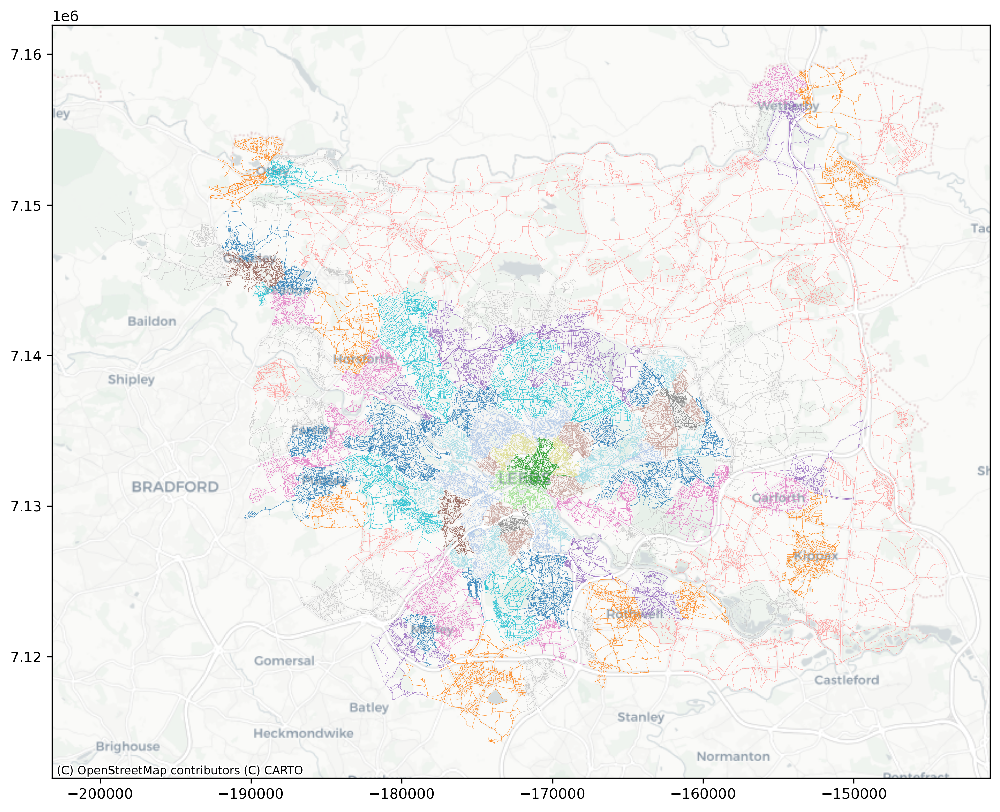

In [11]:
import matplotlib.pyplot as plt
import contextily as ctx

columns = ['cluster']
titles = [f'CityImage Partitions by Radian (n={len(partition_counts)})']

nlabels = max([len(districts[column].unique()) for column in columns])

cmap = 'tab20'
# cmap = ci.rand_cmap(nlabels = nlabels, type_color='bright')
plt.rcParams['figure.dpi'] = 300
fig, ax = plt.subplots(figsize=(10, 8), dpi=300)

districts.to_crs(epsg=3857).plot(
    ax=ax,
    column=columns[0],
    cmap=cmap,
    legend=False,
    linewidth=0.2
)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
plt.tight_layout()
plt.show()

In [ ]:
# # remove cluster_x and cluster_y from districts
# districts = districts.drop(columns=['cluster_x', 'cluster_y'])
# districts

In [13]:
# To get all data grouped by cluster:
for cluster_id in sorted(districts['cluster'].unique()):
    print(f"\nCluster {cluster_id} data:")
    print(districts[districts['cluster'] == cluster_id])


Cluster 0 data:
        edgeID      u      v  key  \
258        258     87   7483    0   
259        259     87  59996    0   
260        260     87  27569    0   
261        261     88  62377    0   
262        262     88  29462    0   
...        ...    ...    ...  ...   
254341  254341  98857  98858    0   
254344  254344  98858  98859    0   
254346  254346  98858  98860    0   
254347  254347  98859  98861    0   
254350  254350  98860  98861    0   

                                                 geometry  \
258     LINESTRING (-186340.959 6011566.208, -186276.3...   
259     LINESTRING (-186340.959 6011566.208, -186316.4...   
260     LINESTRING (-186340.959 6011566.208, -186415.1...   
261     LINESTRING (-186618.744 6011831.68, -186633.27...   
262     LINESTRING (-186618.744 6011831.68, -186603.99...   
...                                                   ...   
254341  LINESTRING (-201438.144 6015855.397, -201439.2...   
254344  LINESTRING (-201453.433 6015858.662, -2014

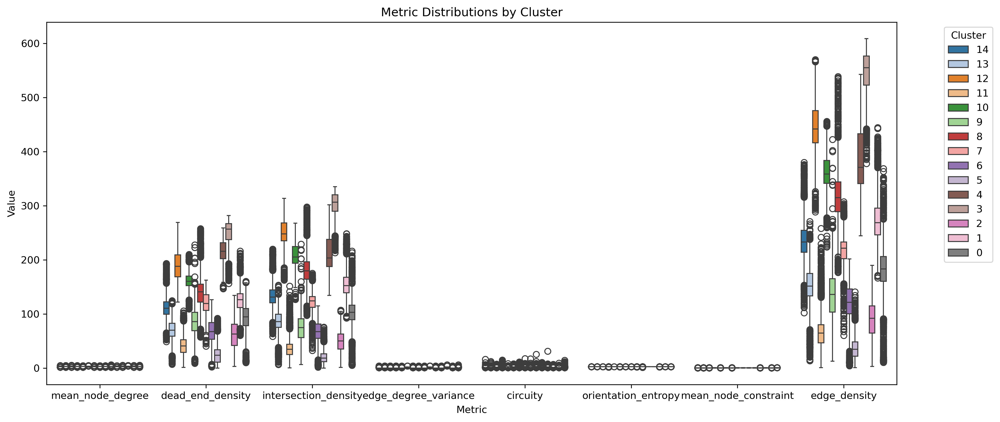

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

districts['cluster'] = districts['cluster'].astype(str)
melted = districts.melt(id_vars='cluster', value_vars=metrics)
melted['cluster'] = melted['cluster'].astype(int)

plt.figure(figsize=(14, 6))
cluster_order = sorted(melted['cluster'].unique(), reverse=True)
palette = sns.color_palette("tab20", n_colors=len(cluster_order))
sns.boxplot(x='variable', y='value', hue='cluster', data=melted, palette=palette, hue_order=cluster_order)

plt.title('Metric Distributions by Cluster')
plt.xlabel('Metric')
plt.ylabel('Value')
plt.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

### Now sub-partition these to identify more detailed typological differences between neighbourhoods

In [ ]:
# Sub-partition each partition to create finer-grained morphological units
epsg = 25832  # Define EPSG code for dual graph creation

print("Starting sub-partitioning process...")
print(f"Total partitions to process: {len(districts['p_rad'].unique())}")

all_subpartitions = []
failed_partitions = []

for i, partition_id in enumerate(districts['p_rad'].unique()):
    if i % 100 == 0:
        print(f"Processing partition {i+1}/{len(districts['p_rad'].unique())}...")
    
    # Get edges for this partition
    partition_edges = districts[districts['p_rad'] == partition_id].copy()
    partition_edges = partition_edges.drop(columns=['p_rad'])  # Remove old partition ID before re-partitioning
    
    # Skip if partition is too small (e.g., single edge or very few edges)
    if len(partition_edges) < 3:
        # Keep as is, don't sub-partition
        partition_edges['p_rad_sub'] = partition_id
        partition_edges['parent_partition'] = partition_id
        all_subpartitions.append(partition_edges)
        continue
    
    try:
        # Create dual graph for this partition subset
        partition_nodes = nodes_graph[nodes_graph.index.isin(
            partition_edges['u'].unique().tolist() + partition_edges['v'].unique().tolist()
        )].copy()
        
        # Create dual graph for this subset
        nodesDual_partition, edgesDual_partition = ci.dual_gdf(partition_nodes, partition_edges, epsg)
        dual_graph_partition = ci.dual_graph_fromGDF(nodesDual_partition, edgesDual_partition)
        
        # Re-partition this subset
        subpartitioned = ci.identify_regions(
            dual_graph=dual_graph_partition,
            edges_gdf=partition_edges,
            weight='rad'
        )
        
        # Create unique sub-partition IDs
        subpartitioned['p_rad_sub'] = subpartitioned['p_rad'].astype(str) + '_' + str(partition_id)
        subpartitioned['parent_partition'] = partition_id
        
        all_subpartitions.append(subpartitioned)
        
    except Exception as e:
        print(f"Failed to sub-partition {partition_id}: {e}")
        failed_partitions.append(partition_id)
        # Keep original partition
        partition_edges['p_rad_sub'] = partition_id
        partition_edges['parent_partition'] = partition_id
        all_subpartitions.append(partition_edges)

# Combine all sub-partitions
districts_refined = pd.concat(all_subpartitions, ignore_index=True)

print(f"\nSub-partitioning complete!")
print(f"Original partitions: {len(districts['p_rad'].unique())}")
print(f"Sub-partitions created: {len(districts_refined['p_rad_sub'].unique())}")
print(f"Failed partitions: {len(failed_partitions)}")

districts_refined.head()

In [ ]:
# import matplotlib.pyplot as plt
# columns = ['p_rad_sub']
# nlabels = max([len(districts_refined[column].unique()) for column in columns])
# titles = [f"CityImage Partitions by Radian (n={len(districts_refined['p_rad_sub'].unique())})"]

# cmap = ci.rand_cmap(nlabels = nlabels, type_color='bright')
# plt.rcParams['figure.dpi'] = 300
# fig = plt.figure(figsize=(10, 8), dpi=150)
# fig = ci.plot_gdf(
#     districts_refined,
#     column = columns[0],
#     title = titles[0],
#     geometry_size = 0.2,
#     cmap = cmap,
#     black_background = False,
#     legend = False,
#     figsize = (10, 8)
#     )

# # # Save the plot to the specified directory with high DPI
# # plt.savefig('C:/Users/gy21jw/Documents/Coding/CDAS_Dissertation/Figures/edge_partitions_refined.png', 
# #            bbox_inches='tight', 
# #            pad_inches=0, 
# #            dpi=600)


---

# Set coordinate reference system (CRS)
This cell sets or checks the CRS for the geospatial data to ensure all spatial operations are accurate.

### Points Data

In [ ]:
# # Load the castle_point_points_data.csv
# castle_point_points_data = pd.read_csv('C:/Users/gy21jw/Coding/transfer_resubmission/castle_point_point_data.csv')
# # convert to a geodataframe
# geometry = [Point(xy) for xy in zip(castle_point_points_data.location_point_lon, castle_point_points_data.location_point_lat)]
# castle_point_points_gdf = gpd.GeoDataFrame(castle_point_points_data, geometry=geometry, crs='EPSG:4326')
# castle_point_points_gdf.head()
# del geometry, castle_point_points_data

# Calculate network metrics
This cell calculates various network metrics (e.g., centrality, density) for further analysis and clustering.

### Line Data

In [ ]:
# # Load the castle_point_line_data.csv
# castle_point_line_data = pd.read_csv('C:/Users/gy21jw/Coding/transfer_resubmission/castle_point_line_data.csv')

# # Create a geometry column representing the edge as a LineString
# from shapely.geometry import LineString
# geometry = [
#     LineString([
#         (row['location_line_start_lon'], row['location_line_start_lat']),
#         (row['location_line_end_lon'], row['location_line_end_lat'])
#     ])
#     for idx, row in castle_point_line_data.iterrows()
# ]

# # Create the GeoDataFrame

# castle_point_line_data_gdf = gpd.GeoDataFrame(castle_point_line_data, geometry=geometry, crs='EPSG:4326')
# castle_point_line_data_gdf.head()

In [ ]:
# # Plot the street network, intervention points, and lines on a grey basemap
# import matplotlib.pyplot as plt
# import contextily as ctx

# # Reproject all layers to Web Mercator for basemap compatibility
# edges_webmerc = edges_graph.to_crs(epsg=3857)
# points_webmerc = castle_point_points_gdf.to_crs(epsg=3857)
# lines_webmerc = castle_point_line_data_gdf.to_crs(epsg=3857)

# fig, ax = plt.subplots(figsize=(12, 12))

# # Plot the street network edges in grey
# edges_webmerc.plot(ax=ax, color='grey', linewidth=1, alpha=0.7, label='Street Network')

# # Overlay the intervention points in red
# points_webmerc.plot(ax=ax, color='red', markersize=50, label='Intervention Points')

# # Overlay the lines in red (thicker)
# lines_webmerc.plot(ax=ax, color='red', linewidth=3, label='Intervention edges')

# # Add a grey basemap
# ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, crs=edges_webmerc.crs)

# ax.set_title(city_name+' :Network, Points, and Lines')
# ax.legend()
# plt.show()

### Save the graphs

In [ ]:
# # Save the nodes_graph, edges_graph using dill
with open('C:/Users/gy21jw/Coding/transfer_resubmission/edges_graph.dill', 'wb') as file:
    dill.dump(edges_graph, file)
with open('C:/Users/gy21jw/Coding/transfer_resubmission/nodes_graph.dill', 'wb') as file:
    dill.dump(nodes_graph, file)

### Load the graphs that now contain all the calculated network measures

In [ ]:
# load the edges_graph, nodes_graph and if needs be - uncomment the nodesDual_graph and the edgesDual_graph
# with open('C:/Users/gy21jw/Coding/transfer_resubmission/edges_graph.dill', 'rb') as file:
#     edges_graph = dill.load(file)
# with open('C:/Users/gy21jw/Coding/transfer_resubmission/nodes_graph.dill', 'rb') as file:
#     nodes_graph = dill.load(file)
# with open('C:/Users/gy21jw/Coding/transfer_resubmission/edgesDual_graph.dill', 'rb') as file:
#     edgesDual_graph = dill.load(file)
# with open('C:/Users/gy21jw/Coding/transfer_resubmission/nodesDual_graph.dill', 'rb') as file:
#     nodesDual_graph = dill.load(file)

# Cluster the partitions

### Add the network measures to districts_refined

In [ ]:
# Merge network measures from edges_graph into districts_refined
measure_columns = [
    'mean_node_degree',
    'dead_end_density',
    'intersection_density',
    'edge_degree_variance',
    'circuity',
    'orientation',
    'orientation_entropy',
    'mean_node_constraint',
    'edge_density'
]

districts_refined = districts_refined.merge(
    edges_graph[['u', 'v'] + measure_columns],
    on=['u', 'v'],
    how='left'
)

districts_refined.head(2)

In [ ]:
# Aggregate edge-level metrics to partition level with multiple statistics
import pandas as pd
from scipy.stats import skew
metrics = [
    'dead_end_density', # Should identify regions of cul-de-sac type neighbourhoods
    'orientation_entropy',
    'mean_node_degree',
    # 'intersection_density'
    'edge_degree_variance',
    'circuity'
    # add more metrics if needed
 ]
agg_funcs = ['mean', 'std', 'min', 'max', skew]
partition_stats = districts_refined.groupby('p_rad_sub')[metrics].agg(agg_funcs)
partition_stats.columns = ['_'.join([m, str(f)]) for m, f in partition_stats.columns]


# ------------------------------------------------------------------------------------------------------------------
# Try weighting `dead_end_density` higher to increase cul=de-sac dominated areas to be clustered separately
# Choose a weighting factor, e.g., 3
# weight_factor = 3

# # Create a weighted version of dead_end_density
# partition_stats['dead_end_density_weighted'] = partition_stats['dead_end_density_mean'] * weight_factor

# # Select features for clustering (include only those you want)
# features = [
#     'dead_end_density_weighted',
#     'orientation_entropy_mean',
#     # add other features as needed
# ]

# Clean and scale
# partition_stats_clean = partition_stats[features].fillna(0)
# from sklearn.preprocessing import MinMaxScaler
# partition_scaled = MinMaxScaler().fit_transform(partition_stats_clean)

# ------------------------------------------------------------------------------------------------------------------
# Try standard scaler
partition_stats = partition_stats.fillna(0)
partition_stats.replace([np.inf, -np.inf], 0, inplace=True)
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
partition_scaled = scaler.fit_transform(partition_stats)

# Try MinMax scaler 
# partition_stats = partition_stats.fillna(0)
# partition_stats.replace([np.inf, -np.inf], 0, inplace=True)
# from sklearn.preprocessing import MinMaxScaler
# partition_scaled = MinMaxScaler().fit_transform(partition_stats)


### Find the number of NaN values (this may happen if there is only, for example a single edge in a particular partition) - replace with 0 value

In [ ]:
print(np.isnan(partition_scaled).sum())

In [ ]:
# print(np.isnan(partition_scaled).sum())
# print(np.isinf(partition_scaled.values).sum())
# print((partition_scaled.std() == 0).sum())
# print(partition_scaled.shape)
# print(partition_scaled.dtypes)

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
import numpy as np

metrics = [
    'dead_end_density', # Should identify regions of cul-de-sac type neighbourhoods
    'orientation',
    'mean_node_degree',
    # 'intersection_density'
    'edge_degree_variance',
    'circuity'
    # add more metrics if needed
 ]

scores = {
    'inertia': [],
    'silhouette': [],
    'calinski_harabasz': [],
    'davies_bouldin': []
}
k_range = range(2, 21)
for k in k_range:
    kmeans = KMeans(n_clusters=k, random_state=1977)
    labels = kmeans.fit_predict(districts_norm)
    scores['inertia'].append(kmeans.inertia_)
    scores['silhouette'].append(silhouette_score(districts_norm, labels))
    scores['calinski_harabasz'].append(calinski_harabasz_score(districts_norm, labels))
    scores['davies_bouldin'].append(davies_bouldin_score(districts_norm, labels))

# CREATE DATAFRAME FIRST
scores_df = pd.DataFrame(scores, index=k_range)

# THEN plot clustering evaluation metrics in a 2x2 grid
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 2, figsize=(12, 10))

# 1. Inertia (Elbow method)
axes[0, 0].plot(k_range, scores_df['inertia'], marker='.', linewidth=1)
axes[0, 0].set_xlabel('Number of clusters (k)')
axes[0, 0].set_ylabel('Inertia')
axes[0, 0].set_title('Elbow Method: Inertia vs k')
axes[0, 0].grid(True, alpha=0.3)

# 2. Silhouette Score (higher is better)
axes[0, 1].plot(k_range, scores_df['silhouette'], marker='.', linewidth=1, color='green')
axes[0, 1].set_xlabel('Number of clusters (k)')
axes[0, 1].set_ylabel('Silhouette Score')
axes[0, 1].set_title('Silhouette Score vs k (higher is better)')
axes[0, 1].grid(True, alpha=0.3)

# 3. Calinski-Harabasz Score (higher is better)
axes[1, 0].plot(k_range, scores_df['calinski_harabasz'], marker='.', linewidth=1, color='orange')
axes[1, 0].set_xlabel('Number of clusters (k)')
axes[1, 0].set_ylabel('Calinski-Harabasz Score')
axes[1, 0].set_title('Calinski-Harabasz Score vs k (higher is better)')
axes[1, 0].grid(True, alpha=0.3)

# 4. Davies-Bouldin Score (lower is better)
axes[1, 1].plot(k_range, scores_df['davies_bouldin'], marker='.', linewidth=1, color='red')
axes[1, 1].set_xlabel('Number of clusters (k)')
axes[1, 1].set_ylabel('Davies-Bouldin Score')
axes[1, 1].set_title('Davies-Bouldin Score vs k (lower is better)')
axes[1, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

# Display the scores table
scores_df

### Convert partition_scaled to a dataframe

In [ ]:
partition_scaled = pd.DataFrame(partition_scaled, columns=partition_stats.columns, index=partition_stats.index)
partition_scaled.head()

In [ ]:
# partition_scaled = partition_scaled[[
#     'dead_end_density_mean',
#     'orientation_entropy_mean',
#     'mean_node_degree_mean',
#     'intersection_density_mean'
# ]]
# partition_scaled

In [ ]:
# # Merge network measures from edges_graph into districts_refined
# measure_columns = [
#     'mean_node_degree',
#     'dead_end_density',
#     'intersection_density',
#     'edge_degree_variance',
#     'circuity',
#     'orientation',
#     'orientation_entropy',
#     'mean_node_constraint',
#     'edge_density'
# ]

# districts_refined = districts_refined.merge(
#     edges_graph[['u', 'v'] + measure_columns],
#     on=['u', 'v'],
#     how='left'
# )

# districts_refined.head(2)partition_scaled.head(2)

In [ ]:
print(districts_refined.columns)
print(partition_scaled.columns)
print(partition_stats.columns)

In [ ]:
import matplotlib.pyplot as plt
import contextily as ctx
from sklearn.cluster import KMeans
k = 4
kmeans = KMeans(n_clusters=k, random_state=1977)
partition_clusters = kmeans.fit_predict(partition_scaled)
partition_cluster_map = pd.Series(partition_clusters, index=partition_stats.index)
districts_refined['cluster'] = districts_refined['p_rad_sub'].map(partition_cluster_map)
districts_refined.head(2)

In [ ]:
# Convert to Web Mercator for plotting
plotdata = districts_refined.copy()
plotdata = plotdata.to_crs(epsg=3857)
fig, ax = plt.subplots(figsize=(20, 16), dpi=150)
plotdata.plot(
    ax=ax,
    column='cluster',
    cmap='tab20',
    linewidth=0.5,
    alpha=1,
    zorder=2
)
ctx.add_basemap(
    ax,
    source=ctx.providers.CartoDB.Positron,
    alpha=0.6,
    zorder=1
)
ax.set_title(f'Partition Clusters (k={k})')
ax.set_axis_off()
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import contextily as ctx

# Convert to Web Mercator for plotting
plotdata = districts_refined.copy()
plotdata = plotdata.to_crs(epsg=3857)

# Create 5x2 subplot grid
fig, axes = plt.subplots(2, 2, figsize=(16, 30), dpi=300)
axes = axes.flatten()  # Flatten to make indexing easier

# Plot each cluster
for i in range(k):
    ax = axes[i]
    
    # Filter data for this cluster
    cluster_data = plotdata[plotdata['cluster'] == i]
    
    # Plot the cluster
    cluster_data.plot(
        ax=ax,
        color='red',
        linewidth=0.1,
        alpha=1,
        zorder=2
    )
    
    # Add basemap
    ctx.add_basemap(
        ax,
        source=ctx.providers.CartoDB.Positron,
        alpha=0.6,
        zorder=1
    )
    
    # Set title with cluster number and edge count
    n_edges = len(cluster_data)
    ax.set_title(f'Cluster {i} (n={n_edges} edges)', fontsize=12, fontweight='bold')
    ax.set_axis_off()

plt.tight_layout()
plt.show()

In [ ]:
# Define Leeds city centre (adjust coordinates if needed - these are approximate OS coordinates)
leeds_centre_x, leeds_centre_y = 430000, 433500  
radius = 2000  # 2km radius

# Calculate distance to centre for each edge
districts_refined['distance_to_centre'] = districts_refined.geometry.centroid.apply(
    lambda point: np.sqrt((point.x - leeds_centre_x)**2 + (point.y - leeds_centre_y)**2)
)

# Split into centre vs periphery
centre = districts_refined[districts_refined['distance_to_centre'] < radius]
periphery = districts_refined[districts_refined['distance_to_centre'] >= radius]

# Compare statistics - using YOUR actual metrics
metrics = ['dead_end_density', 'orientation_entropy', 'mean_node_degree', 'edge_degree_variance']
print("="*80)
print("CENTRE vs PERIPHERY COMPARISON")
print("="*80)
for metric in metrics:
    centre_mean = centre[metric].mean()
    periphery_mean = periphery[metric].mean()
    print(f"\n{metric}:")
    print(f"  Centre:    mean={centre_mean:.3f}, std={centre[metric].std():.3f}, median={centre[metric].median():.3f}")
    print(f"  Periphery: mean={periphery_mean:.3f}, std={periphery[metric].std():.3f}, median={periphery[metric].median():.3f}")
    if periphery_mean != 0:
        print(f"  Ratio (centre/periphery): {centre_mean / periphery_mean:.2f}x")

In [ ]:
# Plot distributions to see separation
fig, axes = plt.subplots(2, 3, figsize=(14, 10))
axes = axes.flatten()

metrics = ['dead_end_density', 'orientation_entropy', 'mean_node_degree', 'edge_degree_variance', 'circuity']

for i, metric in enumerate(metrics):
    ax = axes[i]
    
    # Histograms
    centre[metric].hist(ax=ax, bins=50, alpha=0.6, label='Centre (<2km)', color='red', density=True)
    periphery[metric].hist(ax=ax, bins=50, alpha=0.6, label='Periphery (≥2km)', color='blue', density=True)
    
    # Add mean lines
    ax.axvline(centre[metric].mean(), color='red', linestyle='--', linewidth=2, label=f'Centre mean')
    ax.axvline(periphery[metric].mean(), color='blue', linestyle='--', linewidth=2, label=f'Periphery mean')
    
    ax.set_xlabel(metric)
    ax.set_ylabel('Density')
    ax.set_title(f'{metric} Distribution')
    ax.legend(fontsize=8)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

In [ ]:
# Summary of cluster characteristics - FORMATTED OUTPUT (TRANSPOSED)
cluster_summary = districts_refined.groupby('cluster').agg({
    'dead_end_density': ['mean', 'std'],
    'orientation_entropy': ['mean', 'std'],
    'mean_node_degree': ['mean', 'std'],
    'edge_degree_variance': ['mean', 'std'],
    'circuity': ['mean', 'std']
}).round(2)

cluster_summary.columns = ['_'.join(col) for col in cluster_summary.columns]

# Add cluster sizes as rows
cluster_sizes = districts_refined.groupby('cluster').size()
cluster_pct = (cluster_sizes / len(districts_refined) * 100).round(1)

# Transpose so clusters are columns
cluster_summary_t = cluster_summary.T

# Add size and percentage as new rows
cluster_summary_t.loc['n_edges'] = cluster_sizes
cluster_summary_t.loc['pct_total'] = cluster_pct

# Reorder rows to put size info at top
new_order = ['n_edges', 'pct_total'] + [col for col in cluster_summary_t.index if col not in ['n_edges', 'pct_total']]
cluster_summary_t = cluster_summary_t.loc[new_order]

# Sort columns by cluster size (largest first)
sorted_clusters = cluster_sizes.sort_values(ascending=False).index
cluster_summary_t = cluster_summary_t[sorted_clusters]

print("="*120)
print("LEEDS STREET NETWORK TYPOLOGY - CLUSTER SUMMARY (k=14)")
print("Columns = Clusters (sorted by size), Rows = Metrics")
print("="*120)
display(cluster_summary_t)

# Create a simplified view showing just means (transposed)
print("\n" + "="*120)
print("CLUSTER CHARACTERISTICS - MEAN VALUES ONLY")
print("="*120)

cluster_means = districts_refined.groupby('cluster').agg({
    'dead_end_density': 'mean',
    'orientation_entropy': 'mean',
    'mean_node_degree': 'mean',
    'edge_degree_variance': 'mean',
    'circuity': 'mean'
}).round(2)

# Transpose
cluster_means_t = cluster_means.T

# Add size rows
cluster_means_t.loc['n_edges'] = cluster_sizes
cluster_means_t.loc['pct_total'] = cluster_pct

# Reorder rows
new_order_simple = ['n_edges', 'pct_total', 'dead_end_density', 'orientation_entropy', 
                    'mean_node_degree', 'edge_degree_variance', 'circuity']
cluster_means_t = cluster_means_t.loc[new_order_simple]

# Sort columns by size
cluster_means_t = cluster_means_t[sorted_clusters]

display(cluster_means_t)

---

In [ ]:
# plotdata = districts.copy()
# plotdata = plotdata.to_crs(epsg=3857)
# fig, ax = plt.subplots(figsize=(12, 10))
# cluster_num = 1
# plot_cluster = plotdata[plotdata['cluster'] == cluster_num]
# plot_cluster.plot(
#     ax=ax,
#     column='cluster',
#     cmap='tab20',
#     linewidth=0.5,
#     alpha=1,
#     zorder=2
# )
# ctx.add_basemap(
#     ax,
#     source=ctx.providers.CartoDB.Positron,
#     alpha=0.5,
#     zorder=1
# )
# ax.set_title(f'Partition Clusters (k={k})')
# ax.set_axis_off()
# plt.tight_layout()
# plt.show()

---

In [ ]:
# Heatmap of cluster characteristics using all 4 metrics
from sklearn.preprocessing import StandardScaler

# Get all 4 metrics for each cluster
cluster_profiles = districts_refined.groupby('cluster')[['dead_end_density', 'orientation_entropy', 
                                                   'mean_node_degree', 'edge_degree_variance', 'circuity']].mean()

# Normalize the cluster profiles to see relative differences
cluster_profiles_normalized = pd.DataFrame(
    StandardScaler().fit_transform(cluster_profiles),
    index=cluster_profiles.index,
    columns=cluster_profiles.columns
)

# Create heatmap
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(12, 6))
sns.heatmap(
    cluster_profiles_normalized.T,
    cmap='RdBu_r',
    center=0,
    cbar_kws={'label': 'Standardised Value'},
    linewidths=0.5,
    annot=True,
    fmt='.2f'
)
plt.title('Leeds Street Network Typology - Cluster Characteristics (k=14)')
plt.xlabel('Cluster ID')
plt.ylabel('Network Metrics')
plt.tight_layout()
plt.show()

try weighting certain measures such as dead_end_density to highligth cul-de-sacs - be careful that this does not obscure other features that are not related to deada ends

In [ ]:
k = 7
kmeans = KMeans(n_clusters=k, random_state=1977)
partition_clusters = kmeans.fit_predict(partition_scaled)
partition_cluster_map = pd.Series(partition_clusters, index=partition_stats.index)
districts_refined['cluster'] = districts_refined['p_rad_sub'].map(partition_cluster_map)

# Check sizes
cluster_sizes = districts_refined.groupby('cluster').size()
cluster_pct = (cluster_sizes / len(districts_refined) * 100).round(1)

# Merge any cluster < 2% into nearest cluster based on centroid distance
small_clusters = cluster_pct[cluster_pct < 2.0].index
if len(small_clusters) > 0:
    centroids = pd.DataFrame(partition_scaled).groupby(partition_clusters).mean()
    for small_c in small_clusters:
        # Find nearest centroid
        distances = ((centroids - centroids.loc[small_c])**2).sum(axis=1)
        distances = distances.drop(small_c)
        nearest = distances.idxmin()
        # Reassign
        districts_refined.loc[districts_refined['cluster'] == small_c, 'cluster'] = nearest
        print(f"Merged cluster {small_c} into {nearest}")

In [ ]:
# Map all clusters with colors
import matplotlib.pyplot as plt
import contextily as ctx

cmap = cm.get_cmap('Set1', 5)

fig, ax = plt.subplots(figsize=(15, 15))
districts_refined.plot(column='cluster', cmap=cmap, ax=ax, linewidth=0.5, legend=True)
ctx.add_basemap(ax, crs=districts_refined.crs.to_string(), source=ctx.providers.CartoDB.Positron)
ax.set_axis_off()
plt.title(f'Street Network Clusters (k={len(districts_refined.cluster.unique())})', fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
# Individual cluster maps side by side
n_clusters = districts_refined['cluster'].nunique()
fig, axes = plt.subplots(1, n_clusters, figsize=(6*n_clusters, 6))

for i, cluster_id in enumerate(sorted(districts_refined['cluster'].unique())):
    ax = axes[i] if n_clusters > 1 else axes
    cluster_data = districts_refined[districts_refined['cluster'] == cluster_id]
    
    # Plot this cluster in red
    cluster_data.plot(ax=ax, color='red', linewidth=1)
    
    # Plot other clusters in light gray for context
    districts_refined[districts_refined['cluster'] != cluster_id].plot(
        ax=ax, color='lightgray', linewidth=0.3, alpha=0.3
    )
    
    ctx.add_basemap(ax, crs=districts_refined.crs.to_string(), source=ctx.providers.CartoDB.Positron)
    ax.set_title(f'Cluster {cluster_id}\n({len(cluster_data):,} edges)', fontsize=12)
    ax.set_axis_off()

plt.tight_layout()
plt.show()